In [1]:
pip install opencv-python numpy


1. Implement YOLOv3 using OpenCV to detect objects in a given image.

In [2]:
import os

# Download YOLOv3 model files
!wget -q https://pjreddie.com/media/files/yolov3.weights -O yolov3.weights
!wget -q https://raw.githubusercontent.com/pjreddie/darknet/master/cfg/yolov3.cfg -O yolov3.cfg
!wget -q https://raw.githubusercontent.com/pjreddie/darknet/master/data/coco.names -O coco.names

# Check if files are downloaded
files = ["yolov3.weights", "yolov3.cfg", "coco.names"]
for file in files:
    if os.path.exists(file):
        print(f"{file} downloaded successfully!")
    else:
        print(f"Error downloading {file}.")

yolov3.weights downloaded successfully!
yolov3.cfg downloaded successfully!
coco.names downloaded successfully!


In [8]:
from google.colab import files
import cv2
import numpy as np

uploaded = files.upload()  # Upload image manually

image_path = list(uploaded.keys())[0]  # Get uploaded file name
print(f"Using image: {image_path}")


Saving ScreenShot-2024-9-27_14-33-51.png to ScreenShot-2024-9-27_14-33-51 (1).png
Using image: ScreenShot-2024-9-27_14-33-51 (1).png


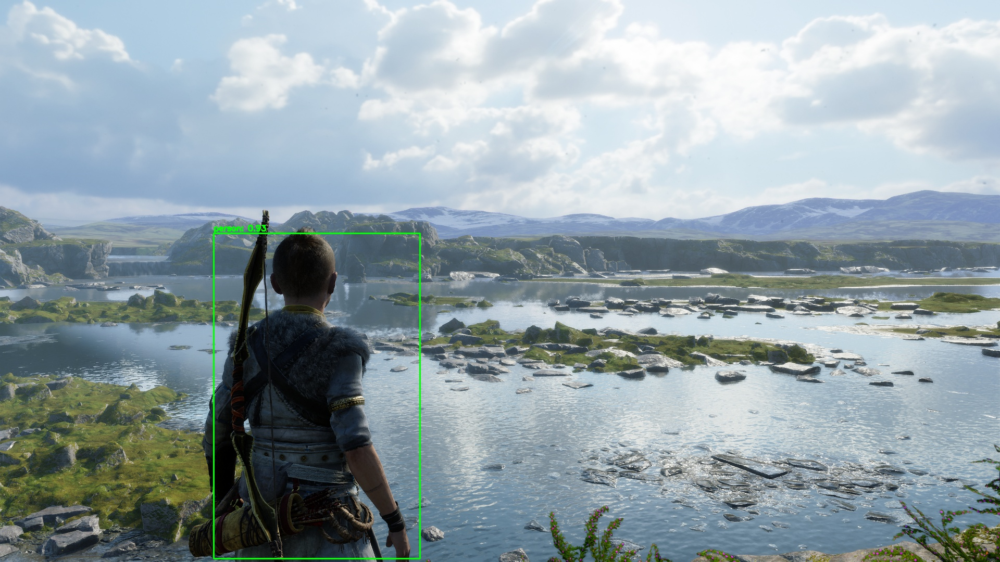

In [9]:
# Load YOLOv3 model
weights_path = "yolov3.weights"
config_path = "yolov3.cfg"
labels_path = "coco.names"

# Load class labels
with open(labels_path, "r") as f:
    classes = f.read().strip().split("\n")

# Load YOLOv3 network
net = cv2.dnn.readNetFromDarknet(config_path, weights_path)
layer_names = net.getLayerNames()
output_layers = [layer_names[i - 1] for i in net.getUnconnectedOutLayers()]

# Load image
image = cv2.imread(image_path)
(H, W) = image.shape[:2]

# Convert image to blob and perform forward pass
blob = cv2.dnn.blobFromImage(image, 1 / 255.0, (416, 416), swapRB=True, crop=False)
net.setInput(blob)
layer_outputs = net.forward(output_layers)

# Initialize lists for detection results
boxes, confidences, class_ids = [], [], []

# Process each detection
for output in layer_outputs:
    for detection in output:
        scores = detection[5:]
        class_id = np.argmax(scores)
        confidence = scores[class_id]

        if confidence > 0.5:
            # Scale bounding box coordinates
            box = detection[0:4] * np.array([W, H, W, H])
            (centerX, centerY, width, height) = box.astype("int")

            x = int(centerX - (width / 2))
            y = int(centerY - (height / 2))

            boxes.append([x, y, int(width), int(height)])
            confidences.append(float(confidence))
            class_ids.append(class_id)

# Apply Non-Maximum Suppression (NMS) to reduce overlapping boxes
indices = cv2.dnn.NMSBoxes(boxes, confidences, 0.5, 0.4)

# Draw bounding boxes
for i in indices.flatten():
    (x, y, w, h) = boxes[i]
    color = (0, 255, 0)  # Green color for bounding box
    cv2.rectangle(image, (x, y), (x + w, y + h), color, 2)
    text = f"{classes[class_ids[i]]}: {confidences[i]:.2f}"
    cv2.putText(image, text, (x, y - 5), cv2.FONT_HERSHEY_SIMPLEX, 0.5, color, 2)

# Save and display output
output_path = "output.jpg"
cv2.imwrite(output_path, image)

# Show output in Colab
from IPython.display import display, Image
display(Image(output_path))


2.WIth and without NMS in opencv

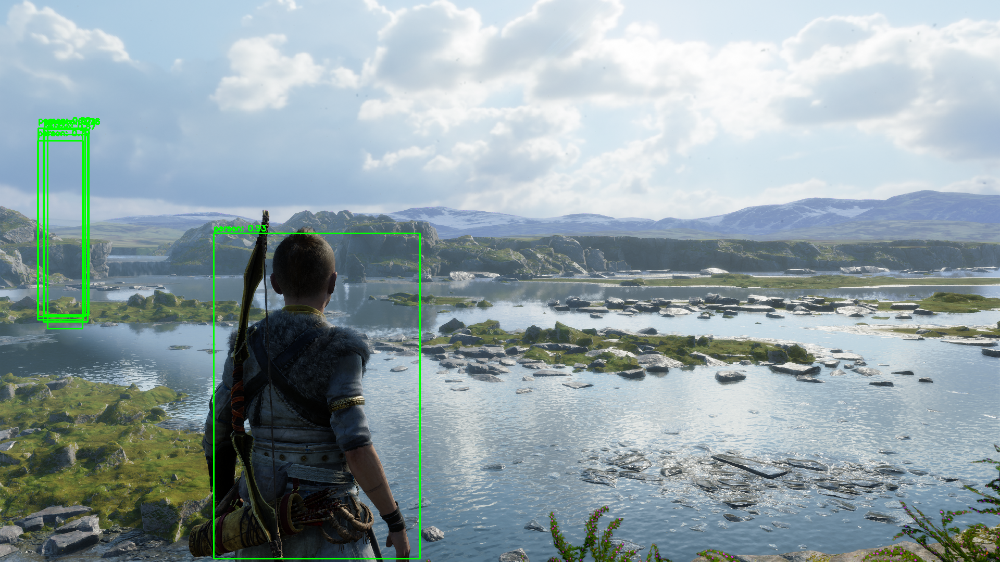

In [13]:
# Prepare image for YOLO
blob = cv2.dnn.blobFromImage(image, 1/255.0, (416, 416), swapRB=True, crop=False)
net.setInput(blob)

# Forward pass to get predictions
layer_outputs = net.forward(output_layers)

# Extract bounding boxes, confidences, and class IDs
boxes = []
confidences = []
class_ids = []

for output in layer_outputs:
    for detection in output:
        scores = detection[5:]
        class_id = np.argmax(scores)
        confidence = scores[class_id]

        if confidence > 0.5:  # Confidence threshold
            center_x, center_y, w, h = (detection[:4] * np.array([width, height, width, height])).astype("int")
            x = int(center_x - w / 2)
            y = int(center_y - h / 2)

            boxes.append([x, y, int(w), int(h)])
            confidences.append(float(confidence))
            class_ids.append(class_id)

# Draw all detections without NMS
image_no_nms = image.copy()
for i in range(len(boxes)):
    x, y, w, h = boxes[i]
    color = (0, 255, 0)  # Green
    cv2.rectangle(image_no_nms, (x, y), (x + w, y + h), color, 2)
    text = f"{classes[class_ids[i]]}: {confidences[i]:.2f}"
    cv2.putText(image_no_nms, text, (x, y - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, color, 2)

cv2_imshow(image_no_nms)  # Display result


Smaller version using ultralytics

In [3]:
pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 949.3/949.3 kB 14.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 94.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 75.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 45.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 12.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 6.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 5.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 81.2 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninstall

In [4]:
from ultralytics import YOLO
import cv2
import torch
import numpy as np
from google.colab.patches import cv2_imshow
from google.colab import files


Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


In [5]:
uploaded = files.upload()  # Manually upload an image

image_path = list(uploaded.keys())[0]  # Get the uploaded file name
print(f"Using image: {image_path}")


Saving ScreenShot-2024-9-27_14-33-51.png to ScreenShot-2024-9-27_14-33-51.png
Using image: ScreenShot-2024-9-27_14-33-51.png


With and without nms in ultralytics

100%|██████████| 6.25M/6.25M [00:00<00:00, 52.7MB/s]



image 1/1 /content/ScreenShot-2024-9-27_14-33-51.png: 384x640 1 person, 1 boat, 1 skis, 295.2ms
Speed: 13.1ms preprocess, 295.2ms inference, 29.0ms postprocess per image at shape (1, 3, 384, 640)


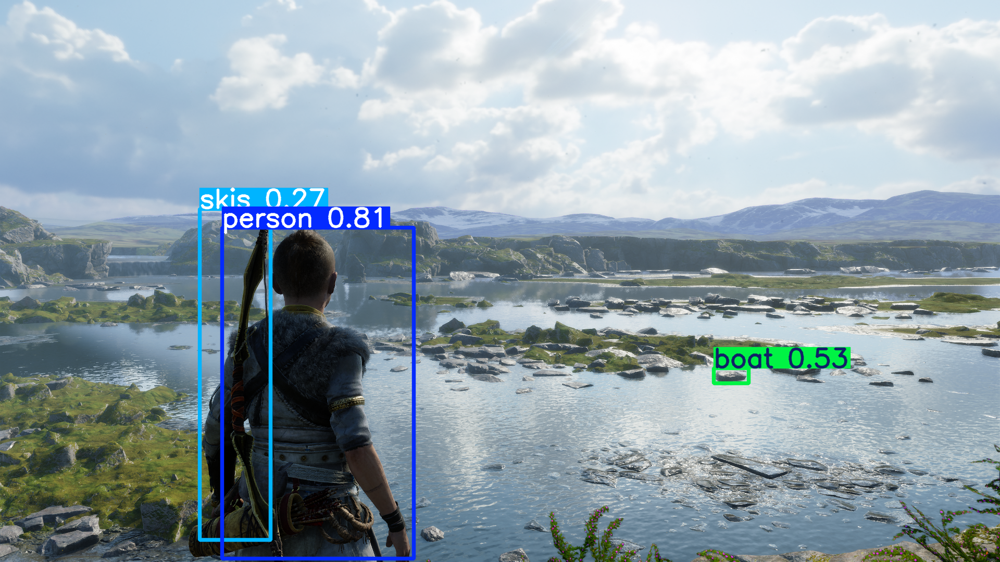

In [6]:
# Load the YOLOv3 model (pretrained on COCO dataset)
model = YOLO("yolov8n.pt")  # YOLOv8 is recommended as Ultralytics focuses on v8, but you can load v3 weights

# Run object detection
results = model(image_path)

# Plot results
res_plotted = results[0].plot()
cv2_imshow(res_plotted)  # Display output image in Colab


In [10]:
# Run detection WITHOUT NMS
results_no_nms = model(image_path, conf=0.5, iou=1.0)  # High IOU keeps all boxes

# Run detection WITH NMS
results_with_nms = model(image_path, conf=0.5, iou=0.45)  # Standard IOU for NMS


image 1/1 /content/ScreenShot-2024-9-27_14-33-51 (1).png: 384x640 10 persons, 1 boat, 158.8ms
Speed: 3.5ms preprocess, 158.8ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /content/ScreenShot-2024-9-27_14-33-51 (1).png: 384x640 1 person, 1 boat, 144.4ms
Speed: 3.0ms preprocess, 144.4ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)


🔴 Detection Without NMS (Many Overlapping Boxes)


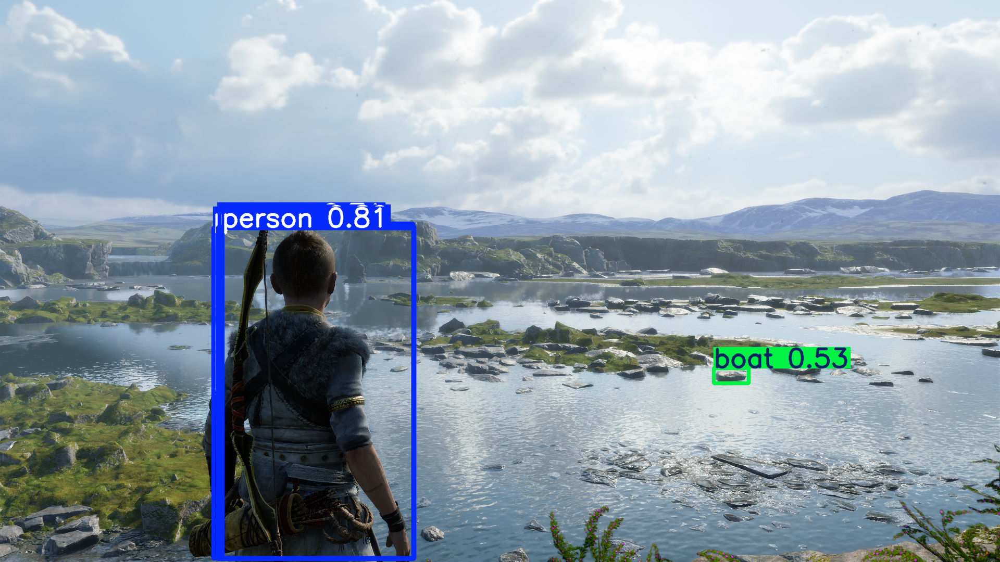

🟢 Detection With NMS (Cleaned Detections)


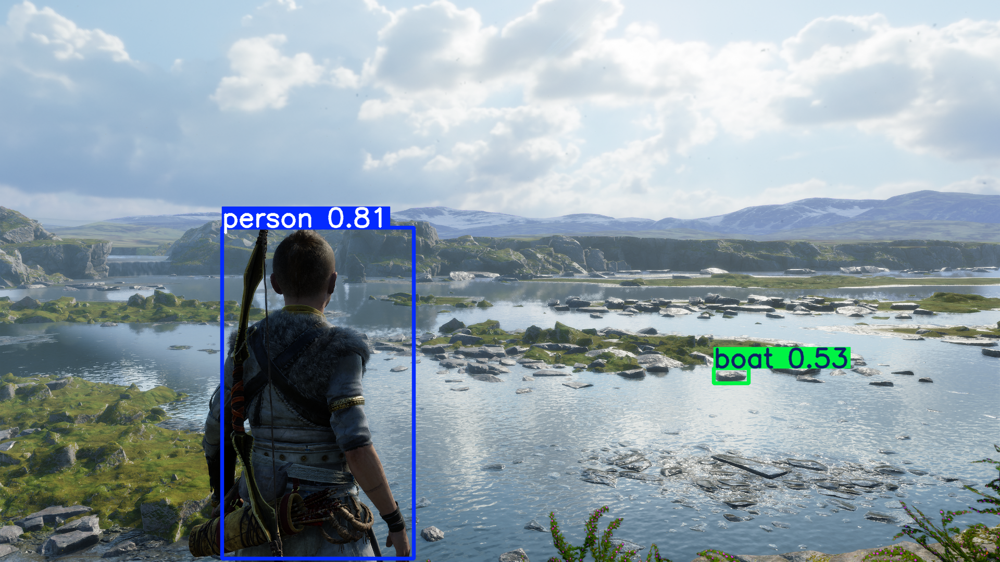

In [11]:
print("🔴 Detection Without NMS (Many Overlapping Boxes)")
cv2_imshow(results_no_nms[0].plot())

# Display results with NMS
print("🟢 Detection With NMS (Cleaned Detections)")
cv2_imshow(results_with_nms[0].plot())